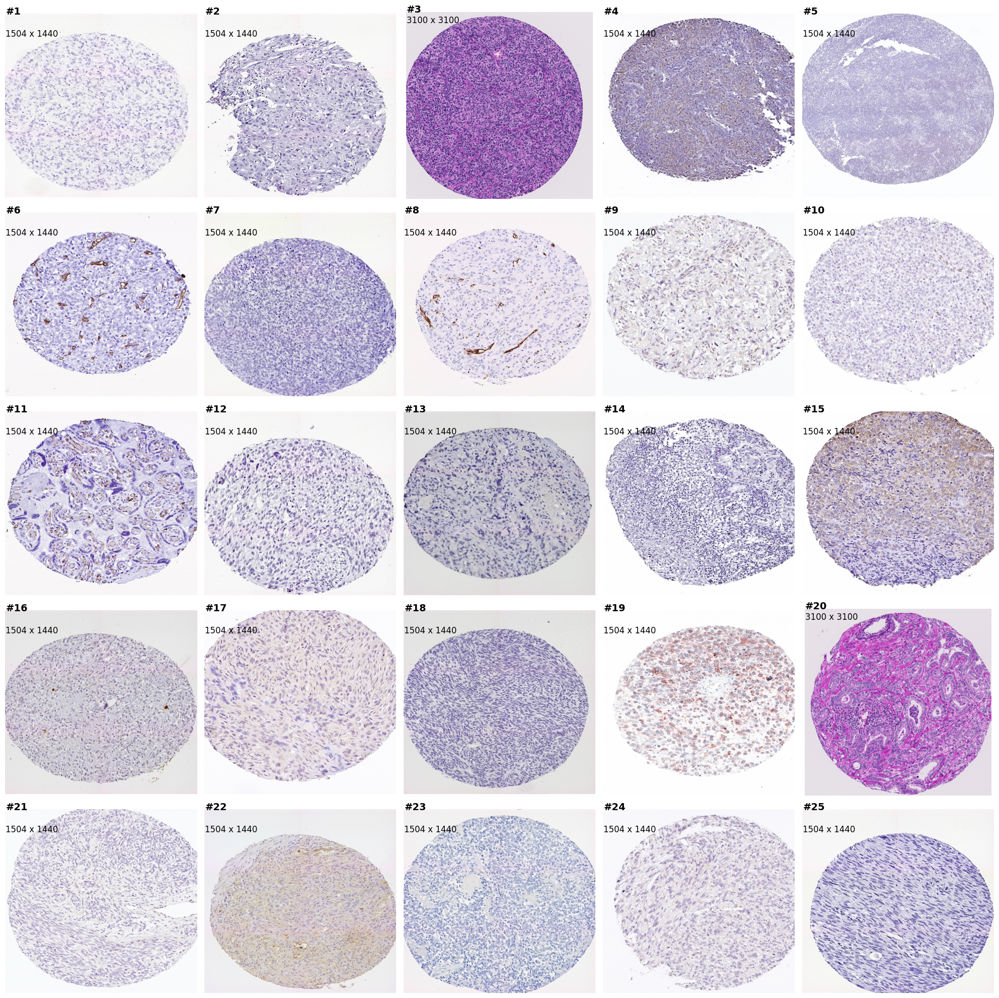

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from random import sample
from PIL import Image  # Import Pillow for image dimension retrieval

# Load the combined CSV file into a DataFrame
combined_df = pd.read_csv('/root/ubc_ocean/alper/models/similar_tmas/similar_images_final_combined.csv')

# Randomly select 25 unique image paths
random_image_paths = sample(combined_df['Similar_Image_Path'].unique().tolist(), 25)

plt.figure(figsize=(20, 20))

for i, img_path in enumerate(random_image_paths, 1):
    img = mpimg.imread(img_path)  # Make sure the img_path is accessible
    
    # Get image dimensions using Pillow
    with Image.open(img_path) as img_pillow:
        width, height = img_pillow.size
    
    plt.subplot(5, 5, i)  # Arrange images in a 5x5 grid
    plt.imshow(img)
    plt.text(5, 5, f'#{i}', color='black', fontsize=14, weight='bold')  # Adjusted position for number label
    plt.text(5, 180, f'{width} x {height}', color='black', fontsize=12)  # Adjusted position for image dimensions
    plt.axis('off')  # Hide axis

plt.tight_layout()
plt.show()


In [7]:
similar_images = pd.read_csv('/root/ubc_ocean/alper/models/similar_tmas/similar_images_final_combined.csv')
len(similar_images)

2023

In [4]:
!pip install pandas

TMA Images with better classifier model

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input

# Function to preprocess a single image
def preprocess_image(image_path, target_size=(224, 224)):
    img = load_img(image_path, target_size=target_size)
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    return np.squeeze(img_array)

# Function to create a dataset from image paths and plot them with their sizes
def create_dataset(image_paths, target_size=(224, 224)):
    images = []
    for path in image_paths:
        images.append(preprocess_image(path, target_size))
    
    # Convert to a numpy array and normalize to [0, 1]
    images = np.array(images).astype('float32') / 255.0
    
    # Plot the images with their sizes as text
    fig, axs = plt.subplots(1, len(images), figsize=(20, 10))
    for i, img in enumerate(images):
        axs[i].imshow(img)
        axs[i].axis('off')
        axs[i].set_title(f'Size: {img.shape[0]}x{img.shape[1]}')
    plt.show()
    
    return images

# Assuming 'similar_images' is a DataFrame with a column 'Similar_Image_Path'
# containing the image paths.
image_paths = similar_images['Similar_Image_Path'] # Taking only the first 10 for demonstration
dataset = create_dataset(image_paths)

In [8]:
len(dataset)

2023

In [ ]:
from sklearn.model_selection import train_test_split

# First split: Separate out a test set
dataset_train_val, x_test = train_test_split(dataset, test_size=0.1)  # 10% for testing

# Second split: Split the remaining data into training and validation sets
x_train, x_val = train_test_split(dataset_train_val, test_size=0.1)  # 10% of 90% for validation

# Now, x_train, x_val, and x_test are your training, validation, and test sets respectively

Auto Encoder


In [20]:
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model

def build_autoencoder(input_shape):
    # Encoder
    input_img = Input(shape=input_shape) # adapt this if using `channels_first` image data format
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
    x = MaxPooling2D((2, 2), padding='same')(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2), padding='same')(x)
    encoded = Conv2D(128, (3, 3), activation='relu', padding='same')(x)

    # Decoder
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(encoded)
    x = UpSampling2D((2, 2))(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)
    decoded = Conv2D(input_shape[2], (3, 3), activation='sigmoid', padding='same')(x)

    # Autoencoder Model
    autoencoder = Model(input_img, decoded)
    autoencoder.compile(optimizer='adam', loss='mean_squared_error')

    return autoencoder

# Assuming your preprocessed images are of shape 224x224x3
autoencoder = build_autoencoder((224, 224, 3))
autoencoder.summary()

# You can now train the model using your dataset
autoencoder.fit(x_train, x_train, epochs=50, batch_size=32, validation_data=(x_val, x_val))

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_18 (Conv2D)          (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 112, 112, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 56, 56, 128)       7385

NameError: name 'x_train' is not defined

7/7 [==============================] - 3s 371ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

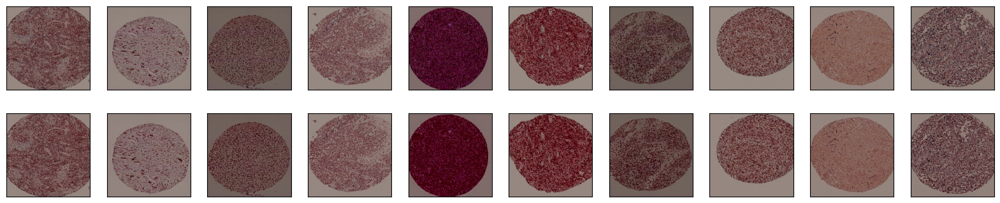

In [13]:

from keras.models import load_model

# Assume `autoencoder` is your trained model, and `x_test` is your test dataset
reconstructed_images = autoencoder.predict(x_test)

# Plotting original and reconstructed images
n = 10  # number of images to be displayed
plt.figure(figsize=(20, 4))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i].reshape(224, 224, 3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(reconstructed_images[i].reshape(224, 224, 3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

# Saving the entire model
autoencoder.save('my_autoencoder.h5')

In [ ]:

from sklearn.model_selection import train_test_split

# First split: Separate out a test set
dataset_train_val, x_test = train_test_split(tmas_data, test_size=0.1)  # 10% for testing

# Second split: Split the remaining data into training and validation sets
x_train, x_val = train_test_split(dataset_train_val, test_size=0.1)  # 10% of 90% for validation

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import os

# Load the data
tma_image_paths = pd.read_csv('/root/ubc_ocean/alper/models/tma_image_paths.csv')
train_labels = pd.read_csv('/root/ubc/train.csv')

# Extract the image ID from the file path
tma_image_paths['image_id'] = tma_image_paths['img_path'].apply(lambda x: os.path.splitext(os.path.basename(x))[0])

# Convert the image_id in train_labels to string if it's not already
train_labels['image_id'] = train_labels['image_id'].astype(str)

# Merge the two DataFrames based on the image_id
merged_data = pd.merge(tma_image_paths, train_labels, on='image_id')

# Split your data into train, validation, and test sets ensuring at least one sample from each label in the test set
grouped = merged_data.groupby('label')
test_data = pd.concat([group.sample(1, random_state=42) for name, group in grouped])
train_val_data = merged_data.drop(test_data.index)
x_train, x_val = train_test_split(train_val_data, test_size=0.2, random_state=42)

# Convert these to lists of image paths for training the model
train_image_paths = x_train['img_path'].tolist()
train_labels = x_train['label'].values

val_image_paths = x_val['img_path'].tolist()
val_labels = x_val['label'].values

test_image_paths = test_data['img_path'].tolist()
test_labels = test_data['label'].values

train_labels

In [4]:
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Flatten, Dense, Dropout
from keras.models import Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input
import numpy as np

# Function to preprocess a single image
def preprocess_image(image_path, target_size=(224, 224)):
    img = load_img(image_path, target_size=target_size)
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    return np.squeeze(img_array)


# Extract features for each set
train_features = [preprocess_image(img_path) for img_path in train_image_paths]
val_features = [preprocess_image(img_path) for img_path in val_image_paths]
test_features = [preprocess_image(img_path) for img_path in test_image_paths]
train_features


2023-12-29 01:05:35.142409: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-29 01:05:35.694233: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


[array([[[138.061  , 123.221  , 120.32   ],
         [134.061  , 126.221  , 119.32   ],
         [142.061  , 125.221  , 117.32   ],
         ...,
         [136.061  , 123.221  , 115.32   ],
         [138.061  , 125.221  , 117.32   ],
         [142.061  , 125.221  , 119.32   ]],
 
        [[140.061  , 127.221  , 116.32   ],
         [140.061  , 124.221  , 121.32   ],
         [137.061  , 124.221  , 118.32   ],
         ...,
         [139.061  , 124.221  , 117.32   ],
         [140.061  , 125.221  , 122.32   ],
         [141.061  , 127.221  , 121.32   ]],
 
        [[139.061  , 126.221  , 118.32   ],
         [140.061  , 124.221  , 118.32   ],
         [140.061  , 125.221  , 119.32   ],
         ...,
         [137.061  , 126.221  , 121.32   ],
         [142.061  , 125.221  , 118.32   ],
         [138.061  , 126.221  , 120.32   ]],
 
        ...,
 
        [[140.061  , 125.221  , 118.32   ],
         [138.061  , 125.221  , 118.32   ],
         [137.061  , 125.221  , 119.32   ],
         .

In [5]:
train_labels

array(['LGSC', 'CC', 'HGSC', 'CC', 'HGSC', 'MC', 'MC', 'CC', 'LGSC', 'EC',
       'EC', 'HGSC', 'CC', 'EC', 'EC', 'HGSC'], dtype=object)

In [6]:
val_features

[array([[[139.061, 126.221, 117.32 ],
         [141.061, 122.221, 115.32 ],
         [139.061, 123.221, 117.32 ],
         ...,
         [137.061, 124.221, 120.32 ],
         [138.061, 121.221, 121.32 ],
         [134.061, 124.221, 117.32 ]],
 
        [[131.061, 126.221, 119.32 ],
         [136.061, 124.221, 119.32 ],
         [136.061, 123.221, 118.32 ],
         ...,
         [136.061, 122.221, 117.32 ],
         [134.061, 122.221, 119.32 ],
         [134.061, 122.221, 118.32 ]],
 
        [[138.061, 122.221, 116.32 ],
         [138.061, 124.221, 117.32 ],
         [135.061, 122.221, 120.32 ],
         ...,
         [139.061, 123.221, 117.32 ],
         [139.061, 122.221, 117.32 ],
         [136.061, 122.221, 115.32 ]],
 
        ...,
 
        [[138.061, 122.221, 116.32 ],
         [135.061, 122.221, 118.32 ],
         [138.061, 123.221, 120.32 ],
         ...,
         [139.061, 126.221, 117.32 ],
         [138.061, 127.221, 117.32 ],
         [135.061, 123.221, 118.32 ]],
 
     

In [18]:
# Assuming your autoencoder model is stored in the variable 'autoencoder'
autoencoder.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_6 (Conv2D)           (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 112, 112, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 56, 56, 128)       7385

In [22]:
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Flatten, Dense, Dropout
from keras.models import Model

# Build the encoder model from the existing autoencoder layers
encoder_input = autoencoder.input
encoded_output = autoencoder.get_layer('conv2d_21').output  # This is the last layer of the encoder part

# Flatten the output of the encoder to feed into the dense layers
flattened = Flatten()(encoded_output)

# Add dense layers for classification
hidden = Dense(128, activation='relu')(flattened)
dropout = Dropout(0.5)(hidden)
output = Dense(5, activation='softmax')(dropout)  # num_classes is the number of your target classes

# Create a new model for classification
classifier_model = Model(inputs=encoder_input, outputs=output)

# Compile the model
classifier_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the summary of the new model
classifier_model.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_18 (Conv2D)          (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 112, 112, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 56, 56, 128)       7385

In [17]:
# Convert the list to a NumPy array before normalization
train_features_array = np.array(train_features)
test_features_array = np.array(test_features)
# Normalize the features
train_features_normalized = train_features_array / 255.0
test_features_normalized = test_features_array / 255.0

# Checking the shape and type of the normalized features
shape_of_normalized_features = train_features_normalized.shape
type_of_normalized_features = train_features_normalized.dtype

shape_of_normalized_features_test = test_features_normalized.shape
type_of_normalized_features_test = test_features_normalized.dtype


# Output the shape and type
print("Shape of normalized train features:", shape_of_normalized_features)
print("Type of normalized train features:", type_of_normalized_features)


# Output the shape and type
print("Shape of normalized test features:", shape_of_normalized_features_test)
print("Type of normalized test features:", type_of_normalized_features_test)

Shape of normalized train features: (16, 224, 224, 3)
Type of normalized train features: float32
Shape of normalized test features: (5, 224, 224, 3)
Type of normalized test features: float32


In [14]:
from sklearn.preprocessing import LabelEncoder

# Assuming train_labels is an array of categorical labels
label_encoder = LabelEncoder()
numeric_labels = label_encoder.fit_transform(train_labels)
numeric_labels

numeric_labels_test = label_encoder.fit_transform(test_labels)
numeric_labels_test

from tensorflow.keras.utils import to_categorical

# Assuming there are 5 different classes
num_classes = 5
y_train = to_categorical(numeric_labels, num_classes=num_classes)
y_test = to_categorical(numeric_labels_test, num_classes=num_classes)
y_test



array([[1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1.]], dtype=float32)

In [15]:
label_encoder.fit(train_labels)
label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print(label_mapping)

{'CC': 0, 'EC': 1, 'HGSC': 2, 'LGSC': 3, 'MC': 4}


In [ ]:
classifier_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
print(train_features_normalized, y_train.shape)

Epoch 1/50


1/1 [==============================] - 1s 1s/step - loss: 1.3422 - accuracy: 0.5000 - val_loss: 213.4184 - val_accuracy: 0.2500
Epoch 2/50
1/1 [==============================] - 1s 617ms/step - loss: 110.9644 - accuracy: 0.2500 - val_loss: 81.9179 - val_accuracy: 0.2500
Epoch 3/50
1/1 [==============================] - 1s 614ms/step - loss: 75.4529 - accuracy: 0.2500 - val_loss: 25.2617 - val_accuracy: 0.2500
Epoch 4/50
1/1 [==============================] - 1s 603ms/step - loss: 30.1631 - accuracy: 0.1667 - val_loss: 14.4649 - val_accuracy: 0.2500
Epoch 5/50
1/1 [==============================] - 1s 628ms/step - loss: 19.1829 - accuracy: 0.3333 - val_loss: 8.2184 - val_accuracy: 0.2500
Epoch 6/50
1/1 [==============================] - 1s 603ms/step - loss: 4.0239 - accuracy: 0.6667 - val_loss: 2.1333 - val_accuracy: 0.2500
Epoch 7/50
1/1 [==============================] - 1s 603ms/step - loss: 5.6737 - accuracy: 0.4167 - val_loss: 2.0759 - val_accuracy: 0.5000
Epoch 8/50
1/1 [========

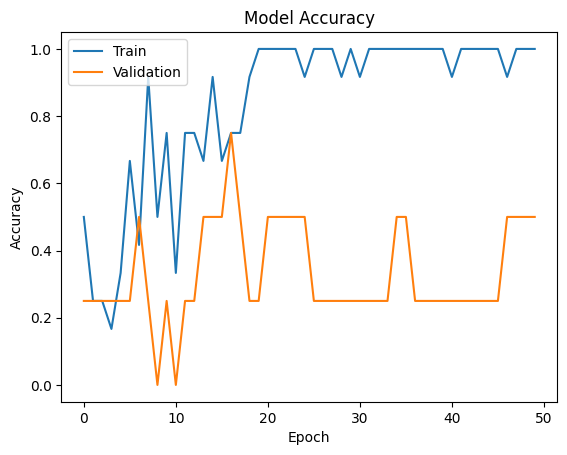

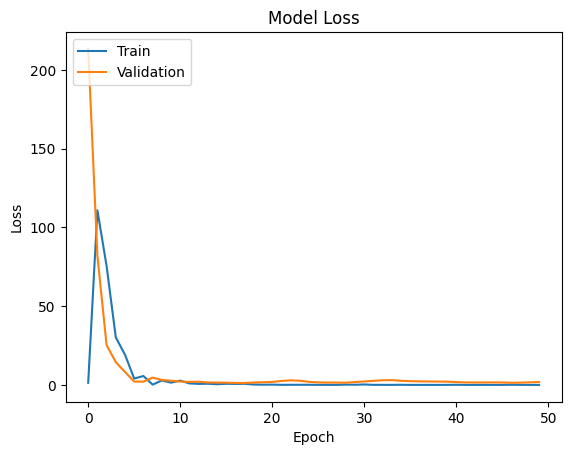

In [20]:
# Training the model
history = classifier_model.fit(
    train_features_normalized, 
    y_train, 
    epochs=50, 
    batch_size=32, 
    validation_split=0.2  # Splitting the training data for validation
)

# Plotting training history
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left') 
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [21]:
# Make predictions on the test set
test_predictions = classifier_model.predict(test_features_normalized)

# The `test_predictions` array will contain the predicted probabilities or labels,
# depending on the last layer of your model and the activation function used.

1/1 [==============================] - 0s 93ms/step


In [22]:
# For binary classification with a single output neuron
predicted_labels = (test_predictions > 0.5).astype(int)

# For multi-class classification with softmax
predicted_labels = np.argmax(test_predictions, axis=1)


In [23]:
# Assuming y_test contains the true labels
from sklearn.metrics import accuracy_score

true_labels = np.argmax(y_test, axis=1)  # Only necessary if y_test is one-hot encoded
accuracy = accuracy_score(true_labels, predicted_labels)

print("Test set accuracy:", accuracy)


Test set accuracy: 0.4


Standford TMAs (EC)

In [24]:
import os
import csv

# Replace this with the path to the folder containing your images
image_folder_path = '/root/ubc_ocean/alper/Stanford_TMAs/Malignant Carcinoma Endometrioid'

# Replace this with the desired path for your CSV file
csv_file_path = 'stanford_tmas.csv'

# Label for each image
label = "EC"

# List of image extensions to look for
image_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff', '.webp']

# Open the CSV file in write mode
with open(csv_file_path, 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    # Write the header
    csvwriter.writerow(['image_path', 'label'])

    # Walk through the directory
    for subdir, dirs, files in os.walk(image_folder_path):
        for file in files:
            # Check if the file has one of the image extensions
            if any(file.lower().endswith(ext) for ext in image_extensions):
                # Write the full path and label to the CSV
                csvwriter.writerow([os.path.join(subdir, file), label])

print(f'Image paths and labels have been written to {csv_file_path}')

Image paths and labels have been written to stanford_tmas.csv


Augmentation of other subtypes

In [21]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25 entries, 0 to 24
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   img_path      25 non-null     object
 1   image_id      25 non-null     object
 2   label         25 non-null     object
 3   image_width   25 non-null     int64 
 4   image_height  25 non-null     int64 
 5   is_tma        25 non-null     bool  
dtypes: bool(1), int64(2), object(3)
memory usage: 1.1+ KB


In [19]:
!pip install opencv-python

In [ ]:
import os
import cv2
import pandas as pd
import numpy as np
from IPython.display import display, Image
from PIL import Image as PILImage
import io
# Directory paths
image_dir = merged_data['img_path']
augmented_dir = '/root/ubc_ocean/alper/models/SAE/augmented_tmas_directory'

if not os.path.exists(augmented_dir):
    os.makedirs(augmented_dir)

# Augmentation functions
def rotate_image(image):
    angle = np.random.choice([90, 180, 270])
    return cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE if angle == 90 else cv2.ROTATE_180 if angle == 180 else cv2.ROTATE_90_COUNTERCLOCKWISE)

def flip_image(image):
    flip = np.random.choice([-1, 0, 1])
    return cv2.flip(image, flip)

def augment_image(image_path):
    image = cv2.imread(image_path)
    if image is None:
        return None
    image = rotate_image(image)
    image = flip_image(image)
    return image

def display_image(img, max_size=256):
    height, width = img.shape[:2]
    scaling_factor = max_size / max(height, width)
    resized_image = cv2.resize(img, None, fx=scaling_factor, fy=scaling_factor, interpolation=cv2.INTER_AREA)
    is_success, buffer = cv2.imencode(".png", resized_image)
    io_buf = io.BytesIO(buffer)
    pil_img = PILImage.open(io_buf)
    display(pil_img)

new_rows = []
# Process non-EC images
for index, row in merged_data.iterrows():
    image_path = row['img_path']
    for i in range(12):  # Generate 12 augmented images per subtype
        augmented_image = augment_image(image_path)
        if augmented_image is not None:
            # display_image(augmented_image)
            new_image_id = f"{row['image_id'].split('.')[0]}_aug_{i}.png"
            image_id = f"{row['image_id'].split('.')[0]}_aug_{i}"
            print(f"{augmented_dir}/{image_id}")
            cv2.imwrite(os.path.join(augmented_dir, new_image_id), augmented_image)
            new_rows.append({
                'img_path': f"{augmented_dir}/{image_id}.png",
                'image_id': image_id,
                'label': row['label'],
                'image_width': row['image_width'],
                'image_height': row['image_height'],
                'is_tma': row['is_tma']
            })

        else:
            print(f"Failed to load image: {image_path}")

df = pd.concat([merged_data, pd.DataFrame(new_rows)], ignore_index=True)

# Save the updated dataframe
df.to_csv('train_augmented.csv', index=False)

In [24]:
merged_data['img_path']

0     /root/ubc_ocean/TMA_images/train_images/35565.png
1     /root/ubc_ocean/TMA_images/train_images/40864.png
2     /root/ubc_ocean/TMA_images/train_images/41586.png
3     /root/ubc_ocean/TMA_images/train_images/36302.png
4     /root/ubc_ocean/TMA_images/train_images/42857.png
5     /root/ubc_ocean/TMA_images/train_images/31594.png
6     /root/ubc_ocean/TMA_images/train_images/53655.png
7     /root/ubc_ocean/TMA_images/train_images/37385.png
8     /root/ubc_ocean/TMA_images/train_images/57696.png
9      /root/ubc_ocean/TMA_images/train_images/8280.png
10    /root/ubc_ocean/TMA_images/train_images/44603.png
11    /root/ubc_ocean/TMA_images/train_images/29084.png
12    /root/ubc_ocean/TMA_images/train_images/13568.png
13    /root/ubc_ocean/TMA_images/train_images/50932.png
14    /root/ubc_ocean/TMA_images/train_images/47035.png
15    /root/ubc_ocean/TMA_images/train_images/17637.png
16    /root/ubc_ocean/TMA_images/train_images/36783.png
17       /root/ubc_ocean/TMA_images/train_images

In [3]:
import pandas as pd
augmented_data = pd.read_csv("train_augmented.csv")

In [4]:
augmented_data['img_path']

0      /root/ubc_ocean/TMA_images/train_images/35565.png
1      /root/ubc_ocean/TMA_images/train_images/40864.png
2      /root/ubc_ocean/TMA_images/train_images/41586.png
3      /root/ubc_ocean/TMA_images/train_images/36302.png
4      /root/ubc_ocean/TMA_images/train_images/42857.png
                             ...                        
320    /root/ubc_ocean/alper/models/SAE/augmented_tma...
321    /root/ubc_ocean/alper/models/SAE/augmented_tma...
322    /root/ubc_ocean/alper/models/SAE/augmented_tma...
323    /root/ubc_ocean/alper/models/SAE/augmented_tma...
324    /root/ubc_ocean/alper/models/SAE/augmented_tma...
Name: img_path, Length: 325, dtype: object

In [5]:
import pandas as pd
from sklearn.model_selection import train_test_split
import os

# Load the data
tma_image_paths = augmented_data['img_path']
train_labels = augmented_data['label']

# Extract the image ID from the file path
tma_image_paths['image_id'] = augmented_data['image_id']
tma_image_paths['image_id']

/tmp/ipykernel_1345394/3057153411.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tma_image_paths['image_id'] = augmented_data['image_id']


0             35565
1             40864
2             41586
3             36302
4             42857
           ...     
320     41368_aug_7
321     41368_aug_8
322     41368_aug_9
323    41368_aug_10
324    41368_aug_11
Name: image_id, Length: 325, dtype: object

In [6]:
from sklearn.model_selection import train_test_split
import pandas as pd
train_augmented = pd.read_csv('/root/ubc_ocean/alper/models/SAE/train_augmented.csv')
# Ensure the 'label' column in the updated dataset is treated as a categorical variable
train_augmented['label'] = train_augmented['label'].astype('category')

# Recalculating the split sizes to ensure all 325 images are used
total_images = len(train_augmented)
train_size = int(0.7 * total_images)  # 70% for training
test_size = int(0.2 * total_images)   # 20% for testing
# The remaining images will be used for validation (approximately 10%)

# Splitting the dataset into training and a temporary subset (train + validation)
train_set_full, temp_set_full = train_test_split(train_augmented, test_size=(total_images - train_size), stratify=train_augmented['label'], random_state=42)

# Further splitting the temporary set into validation and test sets
val_set_full, test_set_full = train_test_split(temp_set_full, test_size=test_size, stratify=temp_set_full['label'], random_state=42)

# Extracting the paths and labels for training, validation, and test sets
train_set_full_image_paths = train_set_full['img_path'].tolist()
train_set_full_labels = train_set_full['label'].values

val_set_full_image_paths = val_set_full['img_path'].tolist()
val_set_full_labels = val_set_full['label'].values

test_set_full_image_paths = test_set_full['img_path'].tolist()
test_set_full_labels = test_set_full['label'].values

# Checking the distribution of labels and the number of images in each set
updated_full_set_distribution = {
    "train_set_full_labels": pd.value_counts(train_set_full_labels),
    "val_set_full_labels": pd.value_counts(val_set_full_labels),
    "test_set_full_labels": pd.value_counts(test_set_full_labels),
    "total_images_in_each_set": [len(train_set_full), len(val_set_full), len(test_set_full)]
}

updated_full_set_distribution

/tmp/ipykernel_1345394/812936193.py:31: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  "train_set_full_labels": pd.value_counts(train_set_full_labels),
/tmp/ipykernel_1345394/812936193.py:32: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  "val_set_full_labels": pd.value_counts(val_set_full_labels),
/tmp/ipykernel_1345394/812936193.py:33: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  "test_set_full_labels": pd.value_counts(test_set_full_labels),


{'train_set_full_labels': EC      46
 MC      46
 CC      45
 HGSC    45
 LGSC    45
 Name: count, dtype: int64,
 'val_set_full_labels': CC      7
 HGSC    7
 LGSC    7
 EC      6
 MC      6
 Name: count, dtype: int64,
 'test_set_full_labels': CC      13
 EC      13
 HGSC    13
 LGSC    13
 MC      13
 Name: count, dtype: int64,
 'total_images_in_each_set': [227, 33, 65]}

In [26]:
from keras.models import load_model
import pandas as pd

# Loading the model (if needed)
autoencoder = load_model('my_autoencoder.h5')

In [27]:
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Flatten, Dense, Dropout
from keras.models import Model

# Build the encoder model from the existing autoencoder layers
encoder_input = autoencoder.input
encoded_output = autoencoder.get_layer('conv2d_21').output  # This is the last layer of the encoder part

# Flatten the output of the encoder to feed into the dense layers
flattened = Flatten()(encoded_output)

# Add dense layers for classification
hidden = Dense(128, activation='relu')(flattened)
dropout = Dropout(0.5)(hidden)
output = Dense(5, activation='softmax')(dropout)  # num_classes is the number of your target classes

# Create a new model for classification
classifier_model = Model(inputs=encoder_input, outputs=output)

# Compile the model
classifier_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the summary of the new model
classifier_model.summary()

classifier_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_18 (Conv2D)          (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 112, 112, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 56, 56, 128)       7385

In [28]:
import numpy as np
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input


# Function to preprocess a single image
def load_and_preprocess_image(image_path, target_size=(224, 224)):
    img = load_img(image_path, target_size=target_size)
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    return np.squeeze(img_array)


# Load and preprocess images
train_images = np.array([load_and_preprocess_image(path) for path in train_set_full_image_paths])
val_images = np.array([load_and_preprocess_image(path) for path in val_set_full_image_paths])
test_images = np.array([load_and_preprocess_image(path) for path in test_set_full_image_paths])

# Encode labels
label_encoder = LabelEncoder()
train_labels_encoded = label_encoder.fit_transform(train_set_full_labels)
val_labels_encoded = label_encoder.transform(val_set_full_labels)
test_labels_encoded = label_encoder.transform(test_set_full_labels)


# Convert labels to one-hot encoding
train_labels_categorical = to_categorical(train_labels_encoded)
val_labels_categorical = to_categorical(val_labels_encoded)
test_labels_categorical = to_categorical(test_labels_encoded)

# --------------------------------------------------------------------------------
# Data Splitting and Organization Process
# Description: 
# This section of the code is dedicated to splitting the original images into 
# training, validation, and test sets, ensuring balanced representation of subtypes. 
# It also includes the process of adding corresponding augmented images to each 
# split, thereby preventing data leakage and maintaining dataset integrity.
# --------------------------------------------------------------------------------


In [ ]:
# Normalize the images to the range [0, 1] if not already done by preprocess_input
train_images_normalized = train_images / 255.0
val_images_normalized = val_images / 255.0
test_images_normalized = test_images / 255.0

# Now, you can use these normalized images for training and validation
history = classifier_model.fit(
    train_images_normalized, train_labels_categorical,
    validation_data=(val_images_normalized, val_labels_categorical),
    epochs=10,  # Adjust the number of epochs as needed
    batch_size=32  # Adjust the batch size as needed
)


Epoch 1/10
8/8 [==============================] - 9s 999ms/step - loss: 32.7330 - accuracy: 0.2423 - val_loss: 1.4563 - val_accuracy: 0.4242
Epoch 2/10
8/8 [==============================] - 8s 961ms/step - loss: 1.3994 - accuracy: 0.3877 - val_loss: 1.4642 - val_accuracy: 0.5152
Epoch 3/10
8/8 [==============================] - 8s 988ms/step - loss: 1.1160 - accuracy: 0.5198 - val_loss: 0.9468 - val_accuracy: 0.6061
Epoch 4/10
8/8 [==============================] - 8s 980ms/step - loss: 0.8268 - accuracy: 0.6564 - val_loss: 1.2001 - val_accuracy: 0.3939
Epoch 5/10
8/8 [==============================] - 8s 978ms/step - loss: 0.9085 - accuracy: 0.6344 - val_loss: 1.0866 - val_accuracy: 0.5455
Epoch 6/10
8/8 [==============================] - 8s 963ms/step - loss: 0.8839 - accuracy: 0.6300 - val_loss: 0.8303 - val_accuracy: 0.7273
Epoch 7/10
8/8 [==============================] - 8s 1000ms/step - loss: 0.6017 - accuracy: 0.7709 - val_loss: 0.7483 - val_accuracy: 0.5758
Epoch 8/10
8/8 [==

In [38]:
test_predictions = classifier_model.predict(test_images_normalized)
len(test_predictions)

3/3 [==============================] - 0s 103ms/step


65

In [54]:
test_loss, test_accuracy = classifier_model.evaluate(test_images_normalized, test_labels_categorical)
print("Test Accuracy: {:.2f}%".format(test_accuracy * 100))

3/3 [==============================] - 0s 101ms/step - loss: 0.5957 - accuracy: 0.8154
Test Accuracy: 81.54%


In [42]:
predicted_labels

array([1, 3, 4, 4, 3, 1, 1, 2, 1, 3, 4, 2, 2, 2, 4, 1, 3, 2, 0, 4, 0, 0,
       1, 2, 0, 0, 4, 1, 3, 3, 3, 4, 2, 2, 1, 2, 0, 3, 2, 3, 3, 4, 1, 0,
       3, 2, 3, 1, 3, 4, 0, 1, 3, 4, 4, 0, 4, 2, 1, 4, 3, 2, 2, 1, 4])

In [45]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np
import torch
# true_labels = np.argmax(test_labels_encoded, axis=1)  # Only necessary if y_test is one-hot encoded
true_labels = np.array(test_labels_encoded)
predicted_labels = np.argmax(test_predictions, axis=1)


# Calculate metrics
accuracy = accuracy_score(true_labels, predicted_labels)
precision = precision_score(true_labels, predicted_labels, average='macro', zero_division=1)
recall = recall_score(true_labels, predicted_labels, average='macro')
f1 = f1_score(true_labels, predicted_labels, average='macro')

# Print the metrics
print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

Accuracy: 0.8615
Precision: 0.8762
Recall: 0.8615
F1 Score: 0.8620


In [30]:
len(test_images_normalized)

65

In [56]:
# Save the entire model to a file
classifier_model.save('my_model_2.h5')

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [50]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Normalize the images to the range [0, 1] if not already done by preprocess_input
train_images_normalized = train_images / 255.0
val_images_normalized = val_images / 255.0
test_images_normalized = test_images / 255.0


# Early stopping to prevent overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=3, verbose=1, mode='min')

# Reduce learning rate when a metric has stopped improving
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=2, min_lr=0.00001, mode='min', verbose=1)

# Now, you can use these normalized images for training and validation
history = classifier_model.fit(
    train_images_normalized, train_labels_categorical,
    validation_data=(val_images_normalized, val_labels_categorical),
    epochs=10,  # Adjust the number of epochs as needed
    batch_size=32,  # Adjust the batch size as needed
    callbacks=[early_stopping,reduce_lr]
)

Epoch 1/10
8/8 [==============================] - 8s 998ms/step - loss: 0.3870 - accuracy: 0.8590 - val_loss: 0.5659 - val_accuracy: 0.7576 - lr: 0.0010
Epoch 2/10
8/8 [==============================] - 8s 1s/step - loss: 0.2300 - accuracy: 0.9383 - val_loss: 0.5185 - val_accuracy: 0.7879 - lr: 0.0010
Epoch 3/10
8/8 [==============================] - 8s 1s/step - loss: 0.1668 - accuracy: 0.9295 - val_loss: 0.5052 - val_accuracy: 0.7576 - lr: 0.0010
Epoch 4/10
8/8 [==============================] - 8s 964ms/step - loss: 0.2481 - accuracy: 0.9427 - val_loss: 0.4728 - val_accuracy: 0.7576 - lr: 0.0010
Epoch 5/10
8/8 [==============================] - 8s 978ms/step - loss: 0.2215 - accuracy: 0.9295 - val_loss: 0.6115 - val_accuracy: 0.7576 - lr: 0.0010
Epoch 6/10
8/8 [==============================] - ETA: 0s - loss: 0.6248 - accuracy: 0.8150
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
8/8 [==============================] - 8s 1s/step - loss: 0.6248 - accur

In [52]:
test_predictions = classifier_model.predict(test_images_normalized)
len(test_predictions)

3/3 [==============================] - 0s 98ms/step


65

In [53]:
test_loss, test_accuracy = classifier_model.evaluate(test_images_normalized, test_labels_categorical)
print("Test Accuracy: {:.2f}%".format(test_accuracy * 100))

3/3 [==============================] - 0s 98ms/step - loss: 0.4137 - accuracy: 0.8462
Test Accuracy: 84.62%


In [54]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np
import torch
# true_labels = np.argmax(test_labels_encoded, axis=1)  # Only necessary if y_test is one-hot encoded
true_labels = np.array(test_labels_encoded)
predicted_labels = np.argmax(test_predictions, axis=1)


# Calculate metrics
accuracy = accuracy_score(true_labels, predicted_labels)
precision = precision_score(true_labels, predicted_labels, average='macro', zero_division=1)
recall = recall_score(true_labels, predicted_labels, average='macro')
f1 = f1_score(true_labels, predicted_labels, average='macro')

# Print the metrics
print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

Accuracy: 0.8462
Precision: 0.8574
Recall: 0.8462
F1 Score: 0.8470


In [ ]:
# Normalize the images to the range [0, 1] if not already done by preprocess_input
train_images_normalized = train_images / 255.0
val_images_normalized = val_images / 255.0
test_images_normalized = test_images / 255.0

# Now, you can use these normalized images for training and validation
history = classifier_model.fit(
    train_images_normalized, train_labels_categorical,
    validation_data=(val_images_normalized, val_labels_categorical),
    epochs=10,  # Adjust the number of epochs as needed
    batch_size=32  # Adjust the batch size as needed
)


Epoch 1/10
8/8 [==============================] - 9s 999ms/step - loss: 32.7330 - accuracy: 0.2423 - val_loss: 1.4563 - val_accuracy: 0.4242
Epoch 2/10
8/8 [==============================] - 8s 961ms/step - loss: 1.3994 - accuracy: 0.3877 - val_loss: 1.4642 - val_accuracy: 0.5152
Epoch 3/10
8/8 [==============================] - 8s 988ms/step - loss: 1.1160 - accuracy: 0.5198 - val_loss: 0.9468 - val_accuracy: 0.6061
Epoch 4/10
8/8 [==============================] - 8s 980ms/step - loss: 0.8268 - accuracy: 0.6564 - val_loss: 1.2001 - val_accuracy: 0.3939
Epoch 5/10
8/8 [==============================] - 8s 978ms/step - loss: 0.9085 - accuracy: 0.6344 - val_loss: 1.0866 - val_accuracy: 0.5455
Epoch 6/10
8/8 [==============================] - 8s 963ms/step - loss: 0.8839 - accuracy: 0.6300 - val_loss: 0.8303 - val_accuracy: 0.7273
Epoch 7/10
8/8 [==============================] - 8s 1000ms/step - loss: 0.6017 - accuracy: 0.7709 - val_loss: 0.7483 - val_accuracy: 0.5758
Epoch 8/10
8/8 [==

# --------------------------------------------------------------------------------
# Data Splitting and Organization Process
# Description: 
# This section of the code is dedicated to splitting the original images into 
# training, validation, and test sets, ensuring balanced representation of subtypes. 
# It also includes the process of adding corresponding augmented images to each 
# split, thereby preventing data leakage and maintaining dataset integrity.
# --------------------------------------------------------------------------------


In [7]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Reload the dataset due to execution environment reset
train_augmented = pd.read_csv('/root/ubc_ocean/alper/models/SAE/train_augmented.csv')


# Identifying base image IDs
train_augmented['base_image_id'] = train_augmented['img_path'].apply(
    lambda x: x.split('/')[-1].split('_aug')[0] if '_aug' in x else x.split('/')[-1].split('.')[0])

# Separate original images
original_images = train_augmented[~train_augmented['img_path'].str.contains('_aug')]

# Split original images into training, validation, and test sets
# Configuring 15 images for training, 5 for validation, and 5 for testing
train_original, remaining_original = train_test_split(original_images, test_size=10, random_state=42)
val_original, test_original = train_test_split(remaining_original, test_size=0.5, random_state=42)

# Function to add ALL augmented images to the same split as their original image
def add_all_augmented_to_split(original_split, all_images):
    # Collecting the base IDs of the original images in the split
    base_ids = original_split['base_image_id'].tolist()
    # Selecting both original and augmented images based on these IDs
    augmented_split = all_images[all_images['base_image_id'].isin(base_ids)]
    return augmented_split

# Add ALL augmented images to each split
train_set = add_all_augmented_to_split(train_original, train_augmented)
val_set = add_all_augmented_to_split(val_original, train_augmented)
test_set = add_all_augmented_to_split(test_original, train_augmented)

# Output the size of each set
len(train_set), len(val_set), len(test_set)


(195, 65, 65)

In [8]:
# Now let's check for potential data leakage
split_dict = {}
for split_name, split_df in zip(['train', 'val', 'test'], [train_set, val_set, test_set]):
    base_ids = split_df['base_image_id'].unique()
    for id in base_ids:
        if id in split_dict:
            split_dict[id].add(split_name)
        else:
            split_dict[id] = {split_name}

# Identifying any base image ids that appear in more than one split
leakage_candidates = {id: splits for id, splits in split_dict.items() if len(splits) > 1}

# Number of potential leakage cases
num_leakage_cases = len(leakage_candidates)
num_leakage_cases, leakage_candidates

(0, {})

These are not working properly splitting the dataset identically, but num_leakage_cases is working properly to check leakage...

In [9]:
# Extracting the paths and labels for training, validation, and test sets
train_set_full_image_paths = train_set['img_path'].tolist()
train_set_full_labels = train_set['label'].values

val_set_full_image_paths = val_set['img_path'].tolist()
val_set_full_labels = val_set['label'].values

test_set_full_image_paths = test_set['img_path'].tolist()
test_set_full_labels = test_set['label'].values

In [10]:
import numpy as np
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input


# Function to preprocess a single image
def load_and_preprocess_image(image_path, target_size=(224, 224)):
    img = load_img(image_path, target_size=target_size)
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    return np.squeeze(img_array)


# Load and preprocess images
train_images = np.array([load_and_preprocess_image(path) for path in train_set_full_image_paths])
val_images = np.array([load_and_preprocess_image(path) for path in val_set_full_image_paths])
test_images = np.array([load_and_preprocess_image(path) for path in test_set_full_image_paths])

# Encode labels
label_encoder = LabelEncoder()
train_labels_encoded = label_encoder.fit_transform(train_set_full_labels)
val_labels_encoded = label_encoder.transform(val_set_full_labels)
test_labels_encoded = label_encoder.transform(test_set_full_labels)


# Convert labels to one-hot encoding
train_labels_categorical = to_categorical(train_labels_encoded)
val_labels_categorical = to_categorical(val_labels_encoded)
test_labels_categorical = to_categorical(test_labels_encoded)

2024-01-20 15:18:10.440787: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-20 15:18:10.440899: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-20 15:18:10.788766: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-20 15:18:12.524473: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-20 15:18:21.696287: W tensorflow/compiler/tf2

In [11]:
# Normalize the images to the range [0, 1] if not already done by preprocess_input
train_images_normalized = train_images / 255.0
val_images_normalized = val_images / 255.0
test_images_normalized = test_images / 255.0

In [14]:
from keras.models import load_model

autoencoder = load_model('my_autoencoder.h5')
autoencoder.summary()

2024-01-20 15:24:57.564072: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:274] failed call to cuInit: CUDA_ERROR_COMPAT_NOT_SUPPORTED_ON_DEVICE: forward compatibility was attempted on non supported HW
2024-01-20 15:24:57.564125: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:129] retrieving CUDA diagnostic information for host: compute-container-ocean-85fc7f47f7-rptmc
2024-01-20 15:24:57.564140: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:136] hostname: compute-container-ocean-85fc7f47f7-rptmc
2024-01-20 15:24:57.564266: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:159] libcuda reported version is: 545.23.8
2024-01-20 15:24:57.564303: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:163] kernel reported version is: 470.223.2
2024-01-20 15:24:57.564317: E external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:244] kernel version 470.223.2 does not match DSO version 545.23.8 -- cannot f

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_18 (Conv2D)          (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 112, 112, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 56, 56, 128)       7385

In [16]:
from tensorflow.keras.layers import Input, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Flatten, Dense, Dropout

# Assuming 'encoded_output' is the output of your encoder and 'input_img' is the input to your autoencoder

# Build the encoder model from the existing autoencoder layers
encoder_input = autoencoder.input
encoded_output = autoencoder.get_layer('conv2d_21').output  # This is the last layer of the encoder part

# Flatten the output of the encoder to feed into the dense layers
flattened = Flatten()(encoded_output)

# Add dense layers for classification with the optimized hyperparameters
hidden = Dense(59, activation='relu')(flattened)  # Using 59 units as per Optuna's suggestion
dropout = Dropout(0.0599)(hidden)  # Using a dropout rate of 5.99%
output = Dense(5, activation='softmax')(dropout)  # Assuming you have 5 classes

# Create the final model
final_model = Model(inputs=encoder_input, outputs=output)

# Compile the model with the optimized learning rate
optimizer = Adam(learning_rate=0.007859)
final_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Now, you can train your final model with the entire dataset or evaluate it further as needed.


In [27]:
# Now, you can use these normalized images for training and validation
history = final_model.fit(
    train_images_normalized, train_labels_categorical,
    validation_data=(val_images_normalized, val_labels_categorical),
    epochs=100,  # Adjust the number of epochs as needed
    batch_size=32  # Adjust the batch size as needed
)

Epoch 1/100
7/7 [==============================] - 6s 877ms/step - loss: 0.3837 - accuracy: 0.8667 - val_loss: 12.0114 - val_accuracy: 0.2154
Epoch 2/100
3/7 [===========>..................] - ETA: 3s - loss: 0.3709 - accuracy: 0.8750

In [24]:
test_predictions = final_model.predict(test_images_normalized)
len(test_predictions)

3/3 [==============================] - 0s 93ms/step


65

In [25]:
test_loss, test_accuracy = final_model.evaluate(test_images_normalized, test_labels_categorical)
print("Test Accuracy: {:.2f}%".format(test_accuracy * 100))

3/3 [==============================] - 0s 94ms/step - loss: 26.0882 - accuracy: 0.2923
Test Accuracy: 29.23%


In [26]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np
import torch
# true_labels = np.argmax(test_labels_encoded, axis=1)  # Only necessary if y_test is one-hot encoded
true_labels = np.array(test_labels_encoded)
predicted_labels = np.argmax(test_predictions, axis=1)


# Calculate metrics
accuracy = accuracy_score(true_labels, predicted_labels)
precision = precision_score(true_labels, predicted_labels, average='macro', zero_division=1)
recall = recall_score(true_labels, predicted_labels, average='macro')
f1 = f1_score(true_labels, predicted_labels, average='macro')

# Print the metrics
print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

Accuracy: 0.2923
Precision: 0.6381
Recall: 0.2462
F1 Score: 0.1727


/root/envs/mvenv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
len(test_images_normalized)

65

In [ ]:
# Save the entire model to a file
classifier_model.save('my_model_2.h5')

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
